# やること

- ベースラインの確認
- 転移学習で確認してみる（VGG16）

## 準備

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

plt.style.use('ggplot')
%matplotlib inline

In [2]:
tf.__version__

'2.3.0'

## データの準備

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [4]:
!mkdir data
!mkdir model

In [5]:
!cp /content/gdrive/'My Drive'/99_tmp/10_learning/*.zip data/

In [6]:
!ls data/

10_84ゴジ.zip  10_GMKゴジ.zip  10_初ゴジ.zip


In [7]:
!unzip data/10_84ゴジ.zip -d data/

Archive:  data/10_84ゴジ.zip
  inflating: data/10_84ゴジ/0_549_750.jpg  
  inflating: data/10_84ゴジ/100_580_520.jpg  
  inflating: data/10_84ゴジ/103_2048_2027.jpg  
  inflating: data/10_84ゴジ/108_1200_1200.jpg  
  inflating: data/10_84ゴジ/109_474_900.jpg  
  inflating: data/10_84ゴジ/10_1200_798.jpg  
  inflating: data/10_84ゴジ/115_1024_1132.jpg  
  inflating: data/10_84ゴジ/116_640_480.jpg  
  inflating: data/10_84ゴジ/117_480_640.jpg  
  inflating: data/10_84ゴジ/119_720_1280.jpg  
  inflating: data/10_84ゴジ/11_640_480.jpg  
  inflating: data/10_84ゴジ/121_480_640.jpg  
  inflating: data/10_84ゴジ/122_480_640.jpg  
  inflating: data/10_84ゴジ/124_537_800.jpg  
  inflating: data/10_84ゴジ/125_853_640.jpg  
  inflating: data/10_84ゴジ/128_580_525.jpg  
  inflating: data/10_84ゴジ/129_480_640.jpg  
  inflating: data/10_84ゴジ/132_1080_1440.png  
  inflating: data/10_84ゴジ/135_500_500.jpg  
  inflating: data/10_84ゴジ/138_1200_1200.jpg  
  inflating: data/10_84ゴジ/141_853_640.jpg  
  inflating: data/10_84ゴジ/142_850_1280.

In [8]:
!unzip data/10_GMKゴジ.zip -d data/

Archive:  data/10_GMKゴジ.zip
  inflating: data/10_GMKゴジ/0_450_600.jpg  
  inflating: data/10_GMKゴジ/101_445_334.jpg  
  inflating: data/10_GMKゴジ/102_721_717.jpg  
  inflating: data/10_GMKゴジ/10_345_620.jpg  
  inflating: data/10_GMKゴジ/112_500_639.jpg  
  inflating: data/10_GMKゴジ/114_549_650.jpg  
  inflating: data/10_GMKゴジ/115_162_235.jpg  
  inflating: data/10_GMKゴジ/116_1198_898.jpg  
  inflating: data/10_GMKゴジ/11_1200_1200.jpg  
  inflating: data/10_GMKゴジ/120_576_621.jpg  
  inflating: data/10_GMKゴジ/124_308_410.jpg  
  inflating: data/10_GMKゴジ/125_384_256.jpeg  
  inflating: data/10_GMKゴジ/128_640_480.jpg  
  inflating: data/10_GMKゴジ/129_814_1255.jpg  
  inflating: data/10_GMKゴジ/130_600_800.jpg  
  inflating: data/10_GMKゴジ/131_694_503.jpg  
  inflating: data/10_GMKゴジ/132_482_425.jpg  
  inflating: data/10_GMKゴジ/135_640_480.jpg  
  inflating: data/10_GMKゴジ/136_176_176.jpg  
  inflating: data/10_GMKゴジ/141_500_375.jpg  
  inflating: data/10_GMKゴジ/143_137_180.jpg  
  inflating: data/10_GMK

In [9]:
!unzip data/10_初ゴジ.zip -d data/

Archive:  data/10_初ゴジ.zip
  inflating: data/10_初ゴジ/0_2448_3264.jpg  
  inflating: data/10_初ゴジ/100_640_480.jpg  
  inflating: data/10_初ゴジ/101_1280_960.jpg  
  inflating: data/10_初ゴジ/102_2186_1536.jpg  
  inflating: data/10_初ゴジ/103_640_480.jpg  
  inflating: data/10_初ゴジ/104_640_480.jpg  
  inflating: data/10_初ゴジ/105_1280_960.jpg  
  inflating: data/10_初ゴジ/108_640_480.jpg  
  inflating: data/10_初ゴジ/109_640_640.jpg  
  inflating: data/10_初ゴジ/10_1200_1200.jpg  
  inflating: data/10_初ゴジ/110_266_355.jpg  
  inflating: data/10_初ゴジ/111_450_600.jpg  
  inflating: data/10_初ゴジ/112_400_225.jpg  
  inflating: data/10_初ゴジ/113_1445_1000.jpg  
  inflating: data/10_初ゴジ/114_3206_4097.jpg  
  inflating: data/10_初ゴジ/115_375_500.jpg  
  inflating: data/10_初ゴジ/118_900_1200.jpg  
  inflating: data/10_初ゴジ/11_659_594.jpg  
  inflating: data/10_初ゴジ/120_1536_2216.jpg  
  inflating: data/10_初ゴジ/121_1200_1200.jpg  
  inflating: data/10_初ゴジ/122_288_400.jpg  
  inflating: d

## 前処理

In [10]:
!ls -l data/10_*/ | wc

    318    2800   18678


In [11]:
from PIL import Image
import os


classes = ['10_初ゴジ', '10_84ゴジ', '10_GMKゴジ']
num_classes = len(classes)
IMAGE_SIZE = 224  # Specified size of VGG16 Default input size in VGG16

X = []  # image file
Y = []  # correct label

for index, classlabel in enumerate(classes):
    photo_dir = './data/' + classlabel
    for root, dirs, files in os.walk(photo_dir):
        for i, file in enumerate(files):
            with Image.open(os.path.join(root, file)) as image:
                # standardize to 'RGB'
                image = image.convert('RGB')
  
                # to make image file all the same size
                image = image.resize((IMAGE_SIZE, IMAGE_SIZE))
                data = np.asarray(image)
                X.append(data)
                Y.append(index)

X = np.array(X)
Y = np.array(Y)
print(X.shape, Y.shape)

(310, 224, 224, 3) (310,)


In [12]:
from sklearn.model_selection import train_test_split

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=71, stratify=Y)
print(X_train.shape, X_test.shape)

(248, 224, 224, 3) (62, 224, 224, 3)


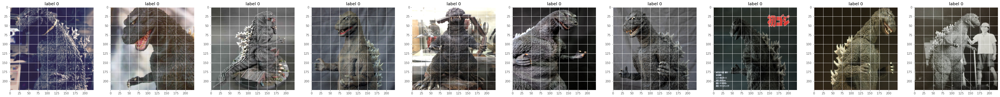

In [14]:
n = 10
_, axes = plt.subplots(figsize=(60, 10), ncols=n)
for idx, ax in enumerate(axes):
  ax.imshow(X[idx])
  ax.set_title(f'label {Y[idx]}')

plt.show()

## モデルの準備

In [16]:
inputs = tf.keras.Input(shape=(None, None, 3))

base_model = tf.keras.applications.VGG16(weights='imagenet',
                            input_tensor=inputs,
                            input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
                            include_top=False,
                            pooling='avg')
base_model.trainable = False

58892288/58889256 [==============================] - 1s 0us/step


In [17]:
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(3, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 512)               14714688  
_________________________________________________________________
dense (Dense)                (None, 256)               131328    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 771       
Total params: 14,846,787
Trainable params: 132,099
Non-trainable params: 14,714,688
_________________________________________________________________


In [20]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [21]:
model.fit(X_train, y_train, epochs=50, validation_split=0.1, batch_size=256)

Epoch 1/50
1/1 [==============================] - 0s 454ms/step - loss: 4.6180 - accuracy: 0.4036 - val_loss: 3.0648 - val_accuracy: 0.2000
Epoch 2/50
1/1 [==============================] - 0s 250ms/step - loss: 4.8098 - accuracy: 0.3722 - val_loss: 3.0898 - val_accuracy: 0.1600
Epoch 3/50
1/1 [==============================] - 0s 249ms/step - loss: 4.9087 - accuracy: 0.3812 - val_loss: 3.0980 - val_accuracy: 0.2000
Epoch 4/50
1/1 [==============================] - 0s 248ms/step - loss: 4.8098 - accuracy: 0.3946 - val_loss: 3.0694 - val_accuracy: 0.2000
Epoch 5/50
1/1 [==============================] - 0s 245ms/step - loss: 4.3335 - accuracy: 0.3857 - val_loss: 3.0261 - val_accuracy: 0.2000
Epoch 6/50
1/1 [==============================] - 0s 252ms/step - loss: 4.1473 - accuracy: 0.4215 - val_loss: 2.9899 - val_accuracy: 0.2400
Epoch 7/50
1/1 [==============================] - 0s 249ms/step - loss: 3.6902 - accuracy: 0.4126 - val_loss: 2.9446 - val_accuracy: 0.2400
Epoch 8/50
1/1 [====

In [26]:
score = model.evaluate(X_train, y_train, batch_size=256)
print(f'loss: {score[0]} - acc: {score[1]}')

1/1 [==============================] - 0s 5ms/step - loss: 0.5740 - accuracy: 0.8065
loss: 0.5739511251449585 - acc: 0.8064516186714172


In [27]:
score = model.evaluate(X_test, y_test, batch_size=256)
print(f'loss: {score[0]} - acc: {score[1]}')

1/1 [==============================] - 0s 2ms/step - loss: 1.3767 - accuracy: 0.5806
loss: 1.376739740371704 - acc: 0.5806451439857483


In [64]:
import pandas as pd
from sklearn.metrics import classification_report

In [65]:
print(classification_report(y_pred=np.argmax(model.predict(X_train), axis=1), y_true=y_train))

              precision    recall  f1-score   support

           0       0.82      0.87      0.84        97
           1       0.83      0.72      0.77        80
           2       0.77      0.82      0.79        71

    accuracy                           0.81       248
   macro avg       0.81      0.80      0.80       248
weighted avg       0.81      0.81      0.81       248



In [66]:
print(classification_report(y_pred=np.argmax(model.predict(X_test), axis=1), y_true=y_test))

              precision    recall  f1-score   support

           0       0.62      0.54      0.58        24
           1       0.50      0.55      0.52        20
           2       0.63      0.67      0.65        18

    accuracy                           0.58        62
   macro avg       0.58      0.59      0.58        62
weighted avg       0.58      0.58      0.58        62



In [44]:
test_df = pd.DataFrame(y_test, columns=['y_true'])

In [52]:
test_df.loc[:, 'y_predict'] = np.argmax(model.predict(X_test), axis=1)
for idx, class_name in enumerate(classes):
  test_df.loc[:, f'predict_proba_{class_name}'] = model.predict_proba(X_test)[:, idx]

Instructions for updating:
Please use `model.predict()` instead.


In [53]:
test_df.head()

,y_true,y_predict,predict_proba_10_初ゴジ,predict_proba_10_84ゴジ,predict_proba_10_GMKゴジ
0,2,2,0.008926,0.002432,0.988642
1,0,0,0.996360,0.003152,0.000488
2,0,0,0.821141,0.082074,0.096785
3,0,0,0.728087,0.078676,0.193237
4,1,0,0.572108,0.424415,0.003476


In [60]:
!pip install japanize-matplotlib

     |████████████████████████████████| 4.1MB 3.5MB/s 
  Created wheel for japanize-matplotlib: filename=japanize_matplotlib-1.1.2-cp36-none-any.whl size=4120191 sha256=3bb0be99b200660cb236704c57a355a95081ad815982bf9060a1cc066edc671f
  Stored in directory: /root/.cache/pip/wheels/9c/f9/fc/bc052ce743a03f94ccc7fda73d1d389ce98216c6ffaaf65afc
Successfully built japanize-matplotlib


In [79]:
def plot_probabilty(classes, n, _df):
  class_name = classes[n]
  con1 = _df['y_true'] == _df['y_predict']
  con2 = _df['y_true'] == n
  con = con1 & con2

  _, ax = plt.subplots(figsize=(20, 5))
  ax.hist(_df[con][f'predict_proba_{class_name}'], bins=30)
  ax.set_xlim(-0.1, 1.1)
  ax.set_ylim(0, 3)
  ax.set_title(f'label={n} True, probabilty')
  plt.show()

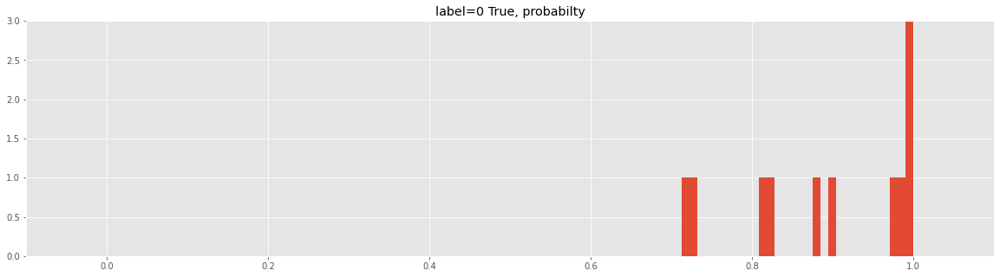

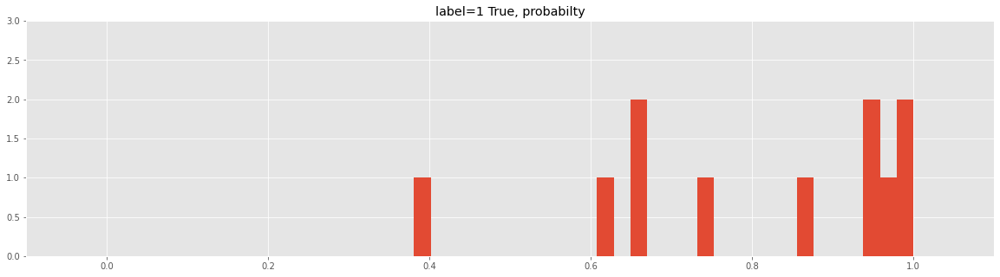

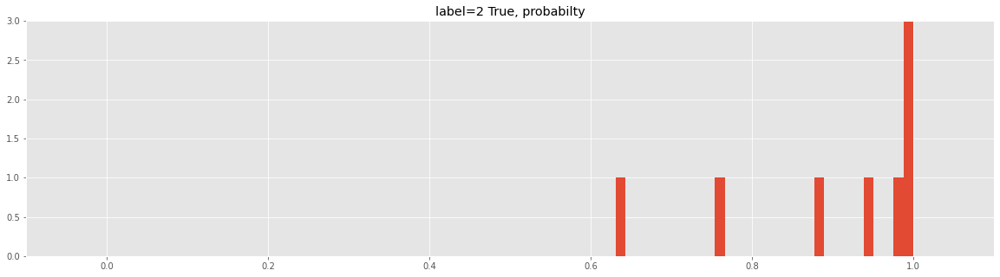

In [80]:
for idx, _ in enumerate(classes):
  plot_probabilty(classes, n=idx, _df=test_df)

In [82]:
n = 1
class_name = classes[n]
con1 = test_df['y_true'] == test_df['y_predict']
con2 = test_df['y_true'] == n
con = con1 & con2
test_df[con]

,y_true,y_predict,predict_proba_10_初ゴジ,predict_proba_10_84ゴジ,predict_proba_10_GMKゴジ
7,1,1,0.000144,0.999853,0.000003
9,1,1,0.003440,0.666568,0.329992
20,1,1,0.208095,0.653343,0.138561
24,1,1,0.022158,0.959085,0.018758
26,1,1,0.386095,0.609056,0.004850
28,1,1,0.000023,0.996892,0.003085
34,1,1,0.000294,0.942448,0.057258
39,1,1,0.017793,0.738495,0.243712
47,1,1,0.120092,0.867313,0.012596
52,1,1,0.041797,0.955225,0.002978


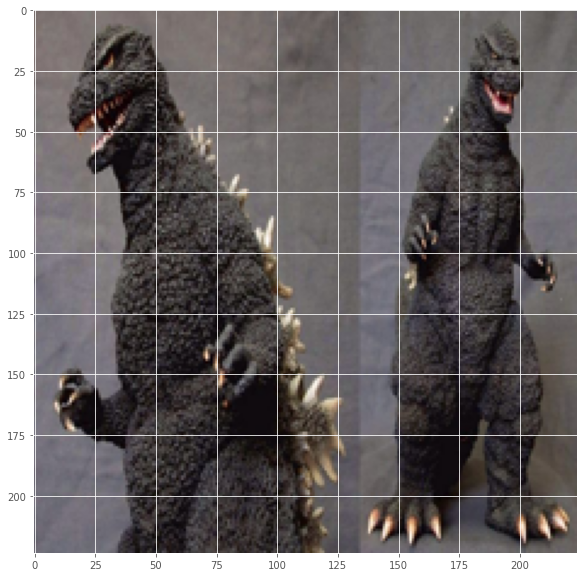

In [93]:
_, ax = plt.subplots(figsize=(10, 10))
ax.imshow(X_test[39])
plt.show()

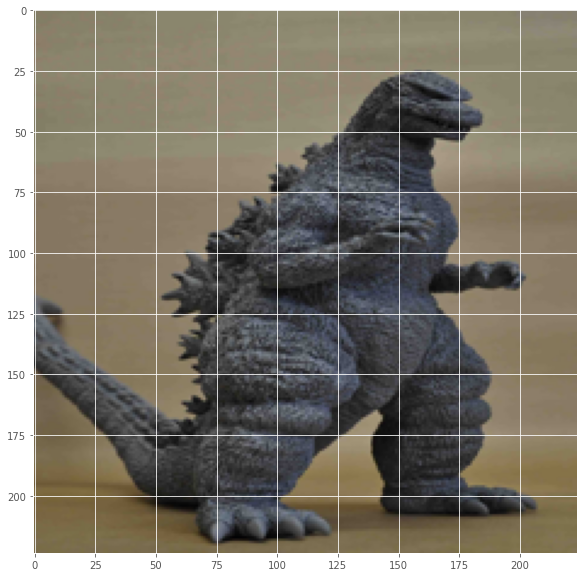

In [92]:
_, ax = plt.subplots(figsize=(10, 10))
ax.imshow(X_test[59])
plt.show()

In [88]:
def plot_probabilty_not_correct(classes, n, _df):
  class_name = classes[n]
  con1 = _df['y_true'] != _df['y_predict']
  con2 = _df['y_true'] == n
  con = con1 & con2

  _, ax = plt.subplots(figsize=(20, 5))
  ax.hist(_df[con][f'predict_proba_{class_name}'], bins=30)
  ax.set_xlim(-0.1, 1.1)
  ax.set_ylim(0, 3)
  ax.set_title(f'label={n} False, probabilty')
  plt.show()

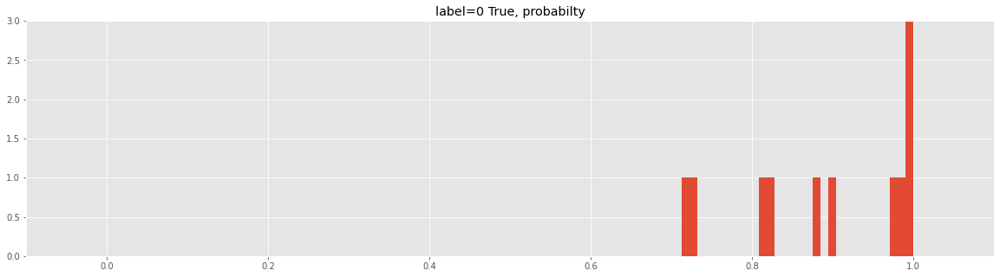

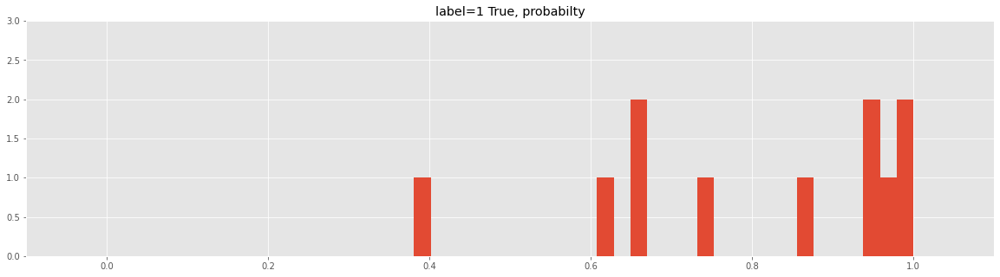

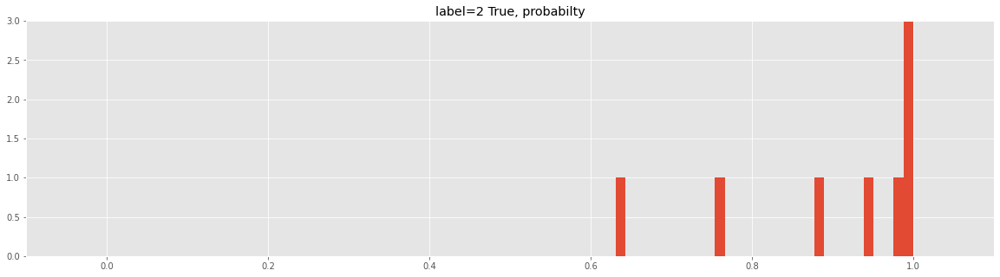

In [89]:
for idx, _ in enumerate(classes):
  plot_probabilty(classes, n=idx, _df=test_df)

In [90]:
n = 0
class_name = classes[n]
con1 = test_df['y_true'] != test_df['y_predict']
con2 = test_df['y_true'] == n
con = con1 & con2
test_df[con]

,y_true,y_predict,predict_proba_10_初ゴジ,predict_proba_10_84ゴジ,predict_proba_10_GMKゴジ
11,0,1,0.060574,0.937349,0.002077
12,0,1,0.188246,0.776205,0.035549
14,0,2,0.048893,0.000579,0.950528
16,0,1,0.452542,0.544455,0.003003
30,0,2,0.326088,0.000327,0.673585
31,0,2,0.052368,0.024845,0.922787
32,0,2,0.020494,0.029578,0.949928
35,0,1,0.027193,0.703657,0.269150
53,0,1,0.007681,0.989115,0.003204
55,0,2,0.012161,0.079157,0.908681


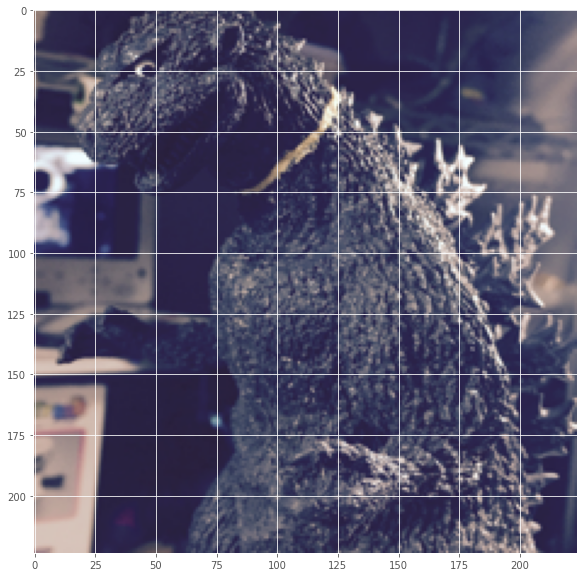

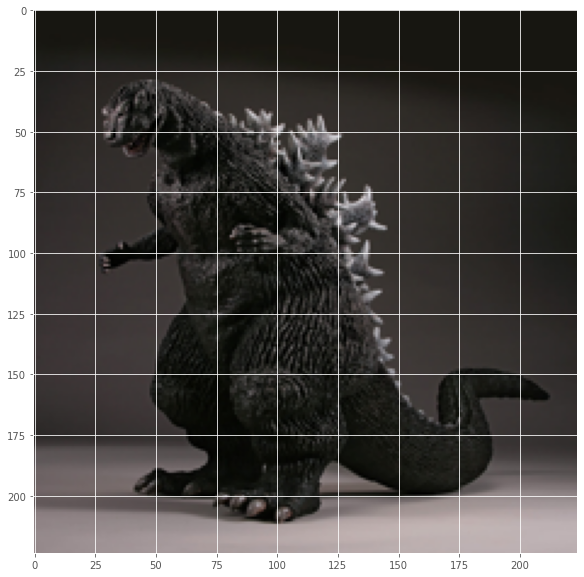

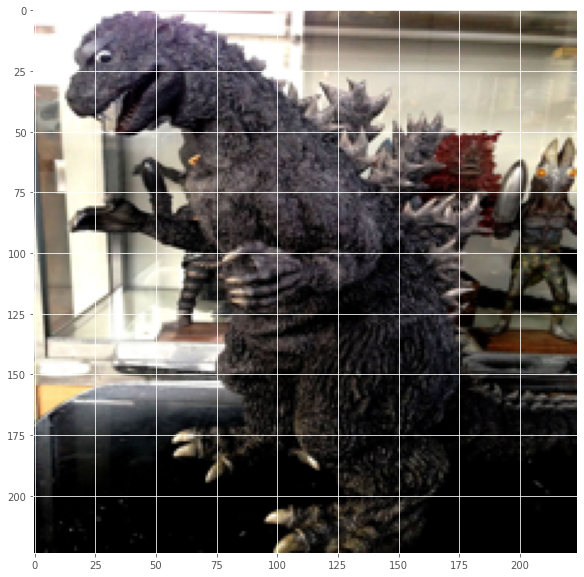

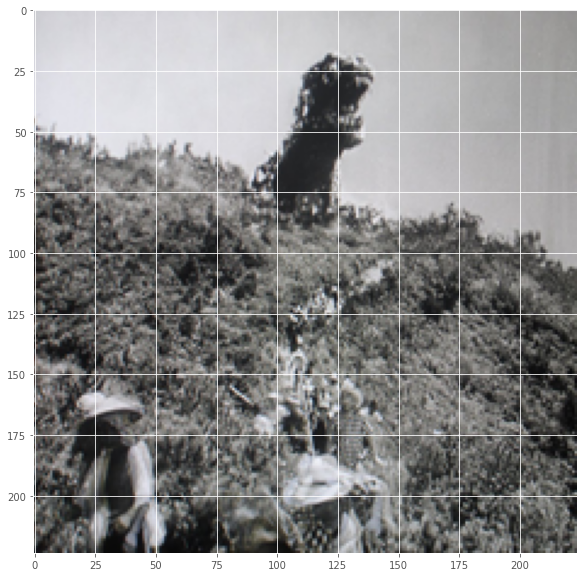

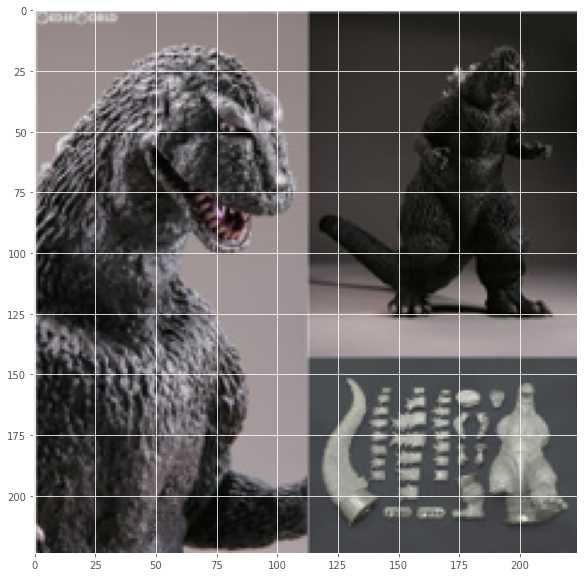

...

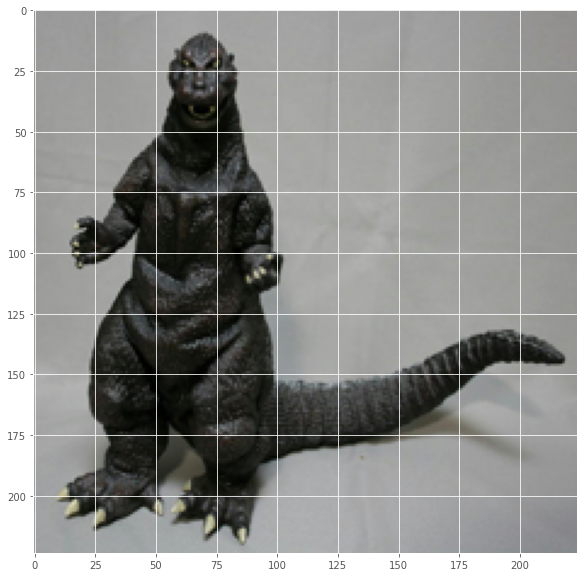

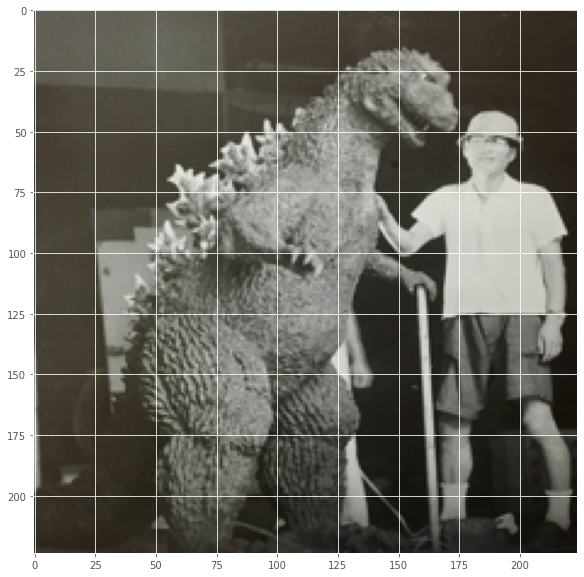

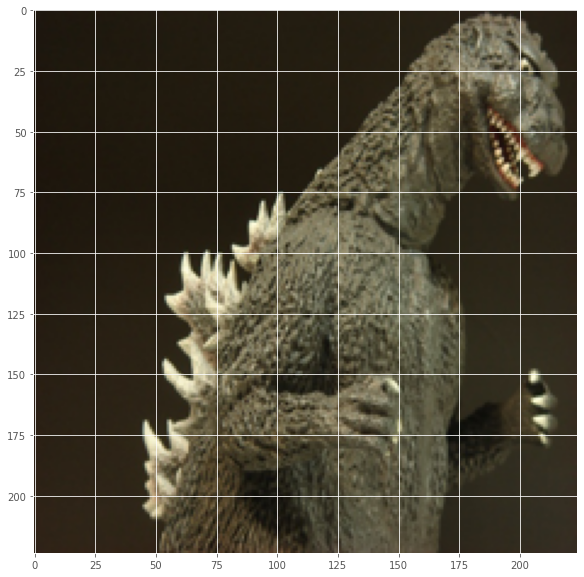

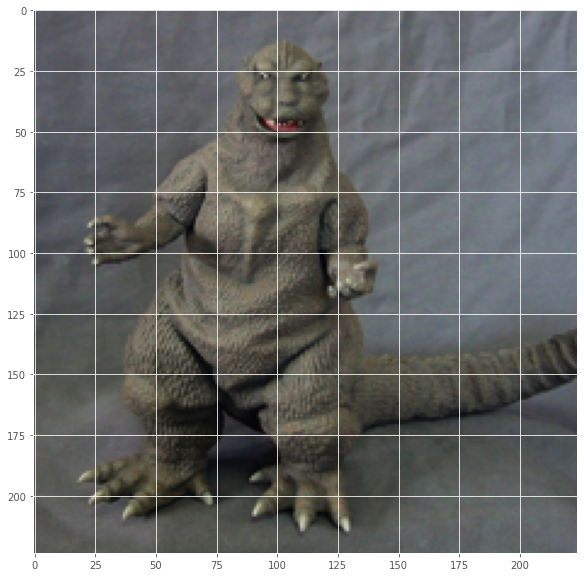

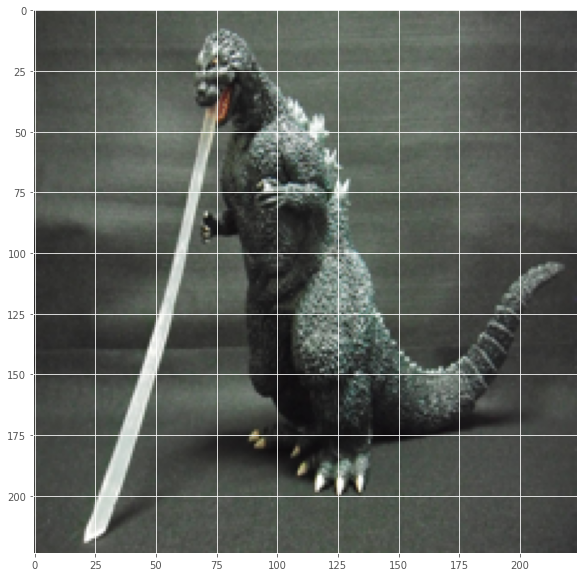

In [94]:
for idx in test_df[con].index.tolist():
  _, ax = plt.subplots(figsize=(10, 10))
  ax.imshow(X_test[idx])
  plt.show()

In [95]:
n = 1
class_name = classes[n]
con1 = test_df['y_true'] != test_df['y_predict']
con2 = test_df['y_true'] == n
con = con1 & con2
test_df[con]

,y_true,y_predict,predict_proba_10_初ゴジ,predict_proba_10_84ゴジ,predict_proba_10_GMKゴジ
4,1,0,0.572108,0.424415,0.003476
19,1,0,0.925837,0.032515,0.041649
23,1,0,0.593664,0.325761,0.080576
37,1,0,0.954155,0.045548,0.000297
41,1,0,0.983621,0.015703,0.000675
43,1,0,0.507029,0.125857,0.367115
45,1,0,0.664208,0.093516,0.242275
49,1,2,0.367225,0.004195,0.628580
56,1,2,0.064296,0.060604,0.875099


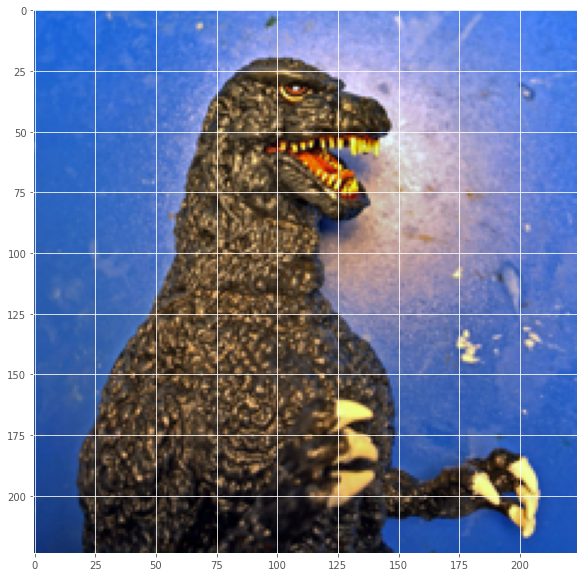

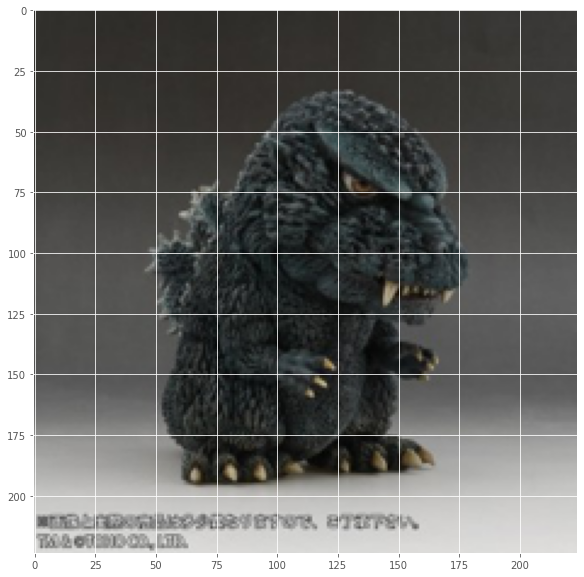

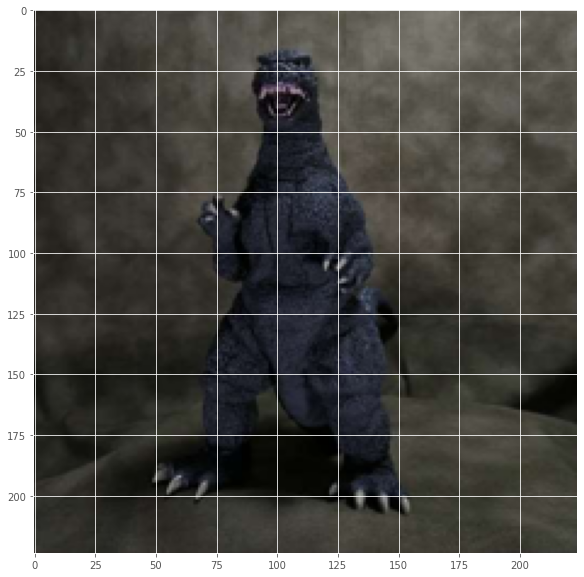

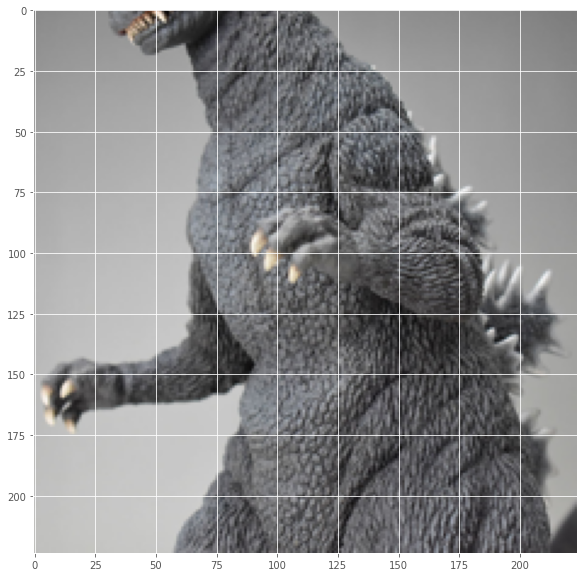

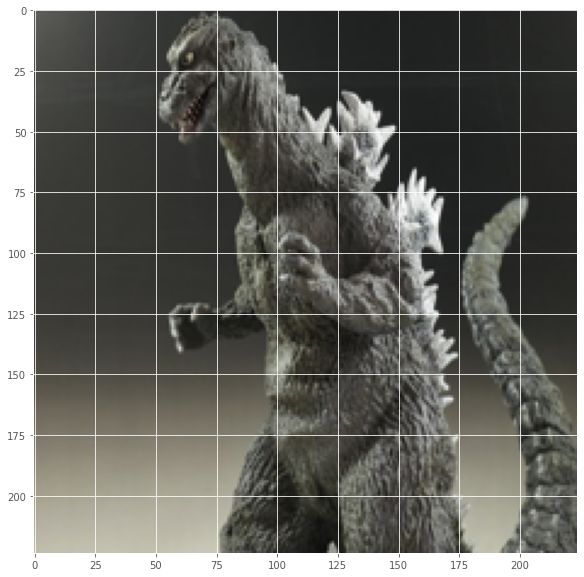

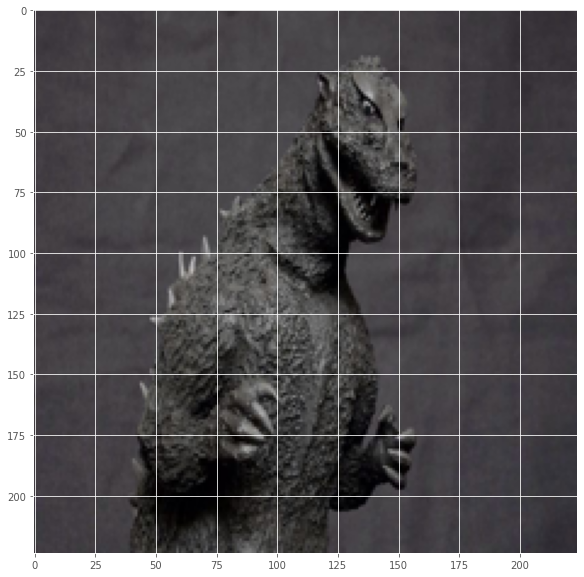

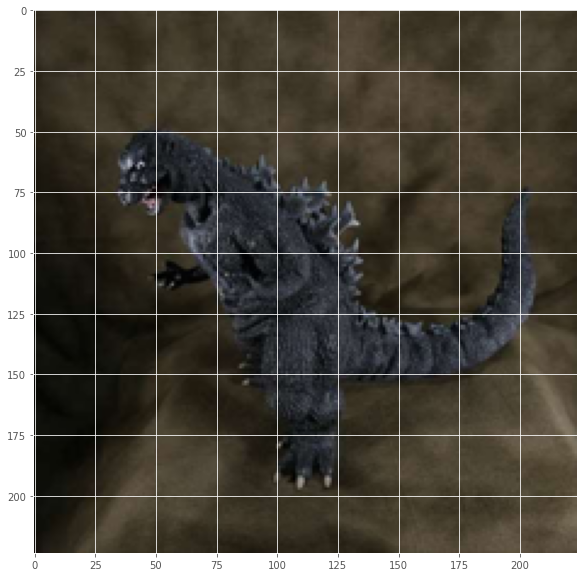

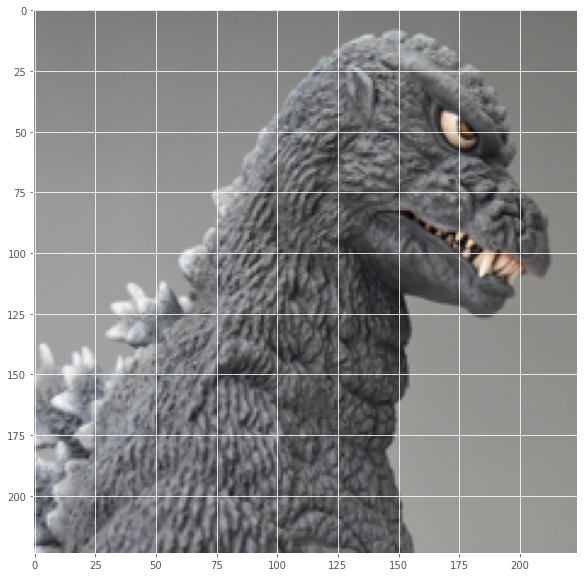

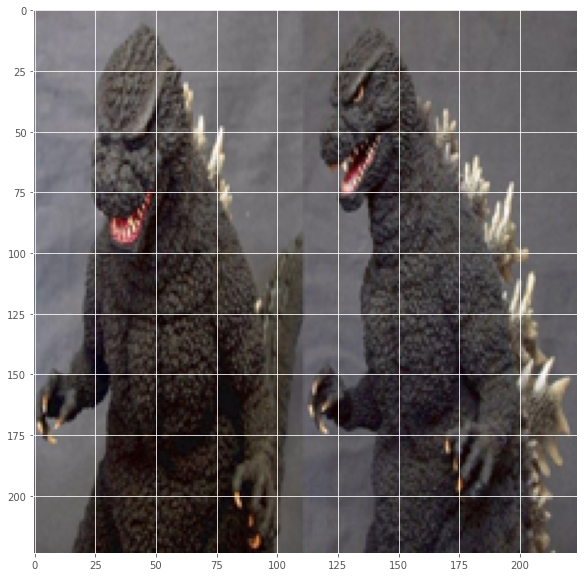

In [96]:
for idx in test_df[con].index.tolist():
  _, ax = plt.subplots(figsize=(10, 10))
  ax.imshow(X_test[idx])
  plt.show()

In [97]:
n = 2
class_name = classes[n]
con1 = test_df['y_true'] != test_df['y_predict']
con2 = test_df['y_true'] == n
con = con1 & con2
test_df[con]

,y_true,y_predict,predict_proba_10_初ゴジ,predict_proba_10_84ゴジ,predict_proba_10_GMKゴジ
13,2,1,0.000065,0.999103,0.000833
21,2,1,0.000456,0.704093,0.295451
36,2,1,0.433644,0.546133,0.020224
38,2,0,0.726689,0.121481,0.151829
44,2,1,0.061573,0.935381,0.003046
60,2,1,0.000012,0.605793,0.394196


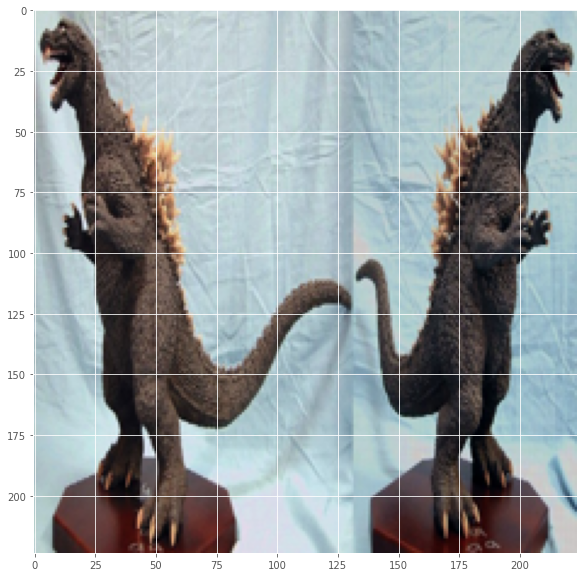

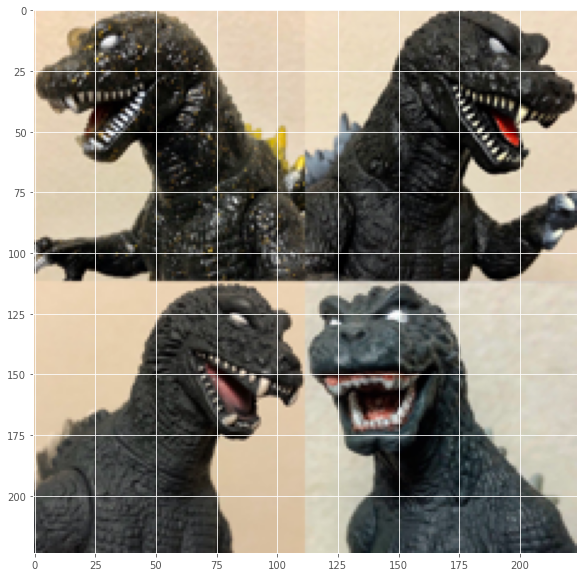

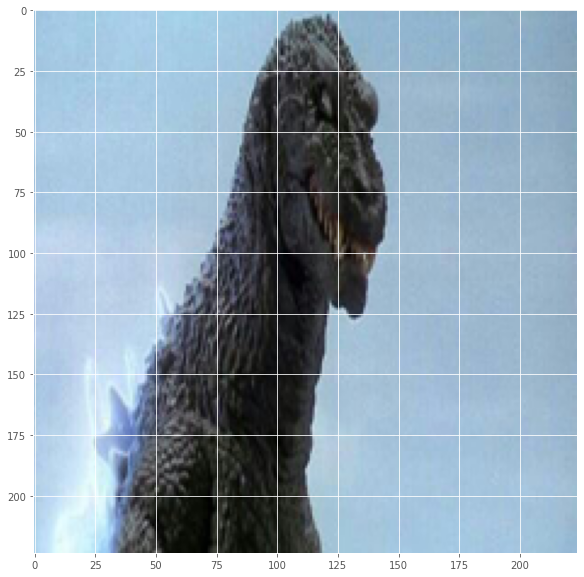

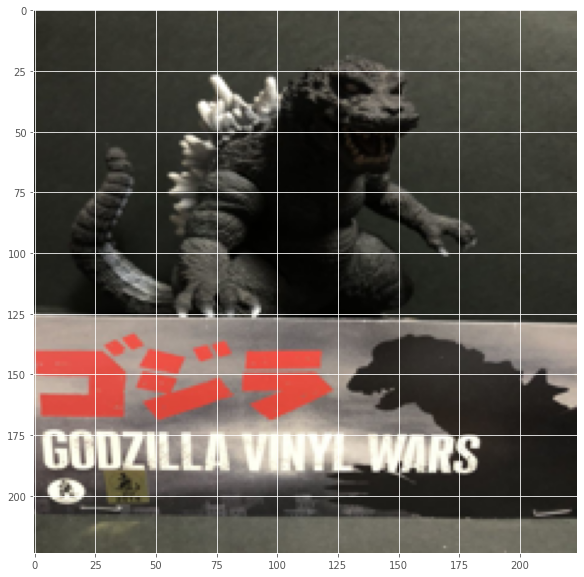

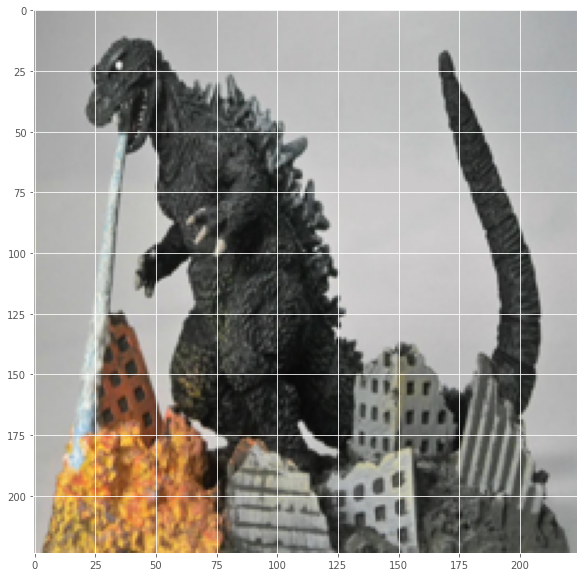

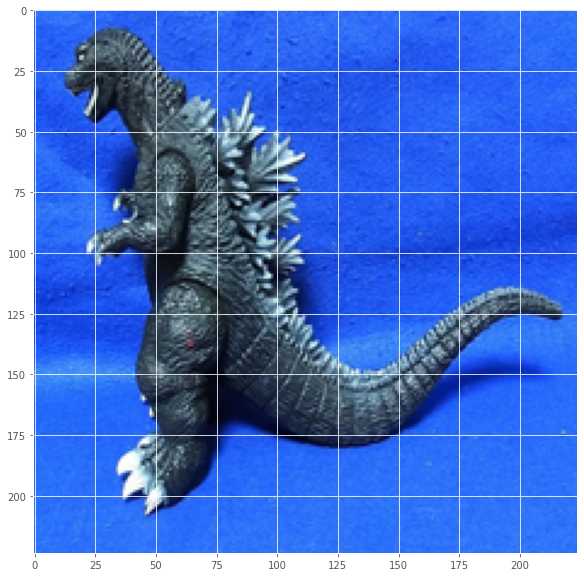

In [98]:
for idx in test_df[con].index.tolist():
  _, ax = plt.subplots(figsize=(10, 10))
  ax.imshow(X_test[idx])
  plt.show()

# まとめ
- VGG16でもよさそうな雰囲気
- ラベルを増やしてみる
- 間違えたケースでおそらくノイズになっている画像があると思うのでラベル確認する